In [1]:
#hide
#!pip install -Uqq fastbook
import fastbook
fastbook.setup_book()

In [2]:
#hide
from fastbook import *
from fastai.vision.widgets import *

In [3]:
from fastai.imports import *

In [4]:
import os
key = os.environ.get('AZURE_SEARCH_KEY', '6186b5c1-1eb8-4f68-ab4b-b4fc98a06ff4')

In [5]:
key

'6186b5c1-1eb8-4f68-ab4b-b4fc98a06ff4'

In [6]:
search_images_bing

<function fastbook.search_images_bing>

In [7]:
pip install bing-image-downloader


In [31]:
from bing_image_downloader import downloader 

for q in ['Michael Jordan', 'Lebron James', 'Kobe Bryant']: 
  downloader.download(q, limit=50, output_dir='new_players', adult_filter_off=True, force_replace=False, timeout=5)

[%] Downloading Images to /content/new_players/Michael Jordan


[!!]Indexing page: 1

[%] Indexed 50 Images on Page 1.


[%] Downloading Image #1 from https://images.complex.com/complex/image/upload/c_limit,dpr_auto,q_90,w_720/fl_lossy,pg_1/tgj4bxjxd8ux751mwpuo.jpg
[%] File Downloaded !

[%] Downloading Image #2 from https://www.macadambasket.com/coolkicks/wp-content/uploads/2016/11/michael-jordan-wearing-air-jordan-3-3.jpg
[%] File Downloaded !

[%] Downloading Image #3 from http://images.solecollector.com/complex/image/upload/qsvbzoujwgfshknhbjju.jpg
[%] File Downloaded !

[%] Downloading Image #4 from https://imageproxy.themaven.net/https:%2F%2Fimages.saymedia-content.com%2F.image%2Ft_share%2FMTYxMDI2MTU0OTk4NTM5Nzc4%2FImage placeholder title.jpg
[!] Issue getting: https://imageproxy.themaven.net/https:%2F%2Fimages.saymedia-content.com%2F.image%2Ft_share%2FMTYxMDI2MTU0OTk4NTM5Nzc4%2FImage placeholder title.jpg
[!] Error:: URL can't contain control characters. '/https:%2F%2Fimages.sa

In [32]:
player_types = 'Michael Jordan','Lebron James','Kobe Bryant'
path = Path('new_players')

In [33]:
if not path.exists():
    path.mkdir()
    for o in player_types:
        dest = (path/o)
        dest.mkdir(exist_ok=True)
        results = search_images_bing(key, f'{o}')
        download_images(dest, urls=results.attrgot('contentUrl'))

In [34]:
get_image_files

<function fastai.data.transforms.get_image_files>

In [35]:
fns = get_image_files(path)
fns

(#150) [Path('new_players/Kobe Bryant/Image_42.jpg'),Path('new_players/Kobe Bryant/Image_38.jpg'),Path('new_players/Kobe Bryant/Image_26.jpg'),Path('new_players/Kobe Bryant/Image_30.jpg'),Path('new_players/Kobe Bryant/Image_35.jpg'),Path('new_players/Kobe Bryant/Image_27.jpg'),Path('new_players/Kobe Bryant/Image_14.jpg'),Path('new_players/Kobe Bryant/Image_11.jpg'),Path('new_players/Kobe Bryant/Image_19.jpg'),Path('new_players/Kobe Bryant/Image_49.jpg')...]

In [36]:
failed = verify_images(fns)
failed

(#0) []

In [37]:
failed.map(Path.unlink);

In [38]:
players = DataBlock(
    blocks=(ImageBlock, CategoryBlock), 
    get_items=get_image_files, 
    splitter=RandomSplitter(valid_pct=0.2, seed=42),
    get_y=parent_label,
    item_tfms=Resize(128))

In [39]:
dls = players.dataloaders(path)

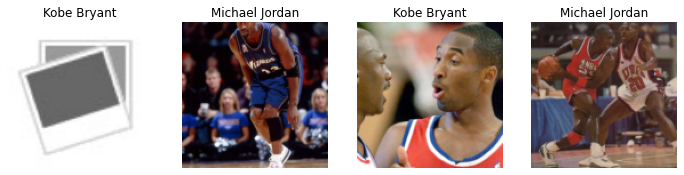

In [40]:
dls.valid.show_batch(max_n=4, nrows=1)

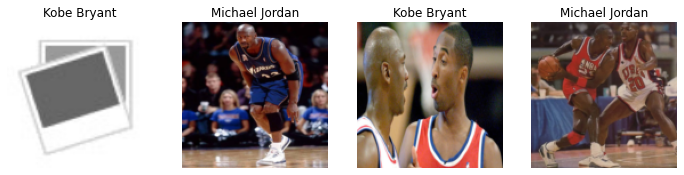

In [41]:
players = players.new(item_tfms=Resize(128, ResizeMethod.Squish))
dls = players.dataloaders(path)
dls.valid.show_batch(max_n=4, nrows=1)

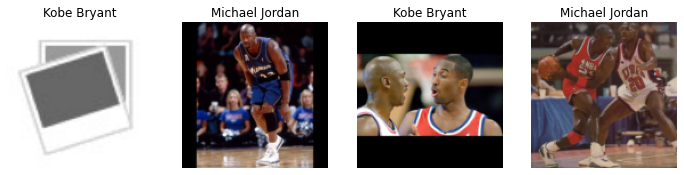

In [42]:
players = players.new(item_tfms=Resize(128, ResizeMethod.Pad, pad_mode='zeros'))
dls = players.dataloaders(path)
dls.valid.show_batch(max_n=4, nrows=1)

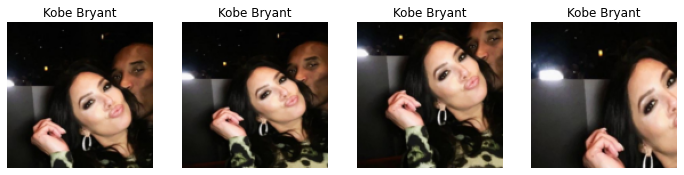

In [43]:
players = players.new(item_tfms=RandomResizedCrop(128, min_scale=0.3))
dls = players.dataloaders(path)
dls.train.show_batch(max_n=4, nrows=1, unique=True)

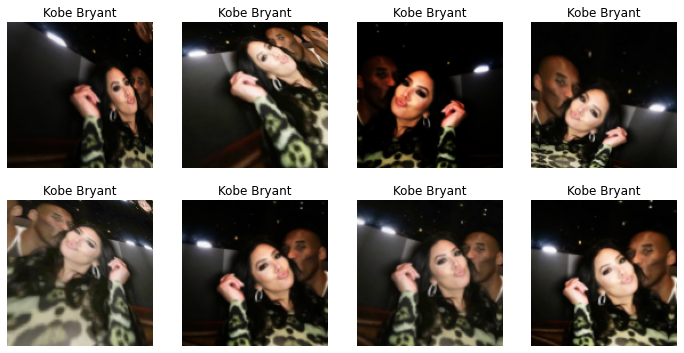

In [44]:
players = players.new(item_tfms=Resize(128), batch_tfms=aug_transforms(mult=2))
dls = players.dataloaders(path)
dls.train.show_batch(max_n=8, nrows=2, unique=True)

In [45]:
players = players.new(
    item_tfms=RandomResizedCrop(224, min_scale=0.5),
    batch_tfms=aug_transforms())
dls = players.dataloaders(path)

In [46]:
learn = cnn_learner(dls, resnet18, metrics=error_rate)
learn.fine_tune(4)

epoch,train_loss,valid_loss,error_rate,time
0,1.814872,2.812138,0.700000,00:05


epoch,train_loss,valid_loss,error_rate,time
0,2.051517,2.189228,0.733333,00:06
1,2.248973,1.346913,0.600000,00:05
2,1.931122,1.010196,0.433333,00:05
3,1.734767,0.903178,0.400000,00:05


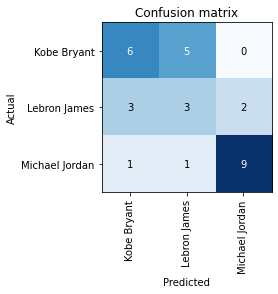

In [47]:
interp = ClassificationInterpretation.from_learner(learn)
interp.plot_confusion_matrix()

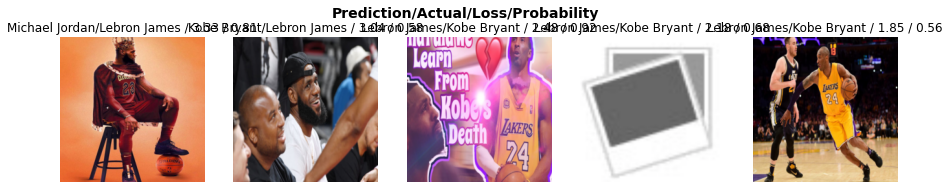

In [48]:
interp.plot_top_losses(5, nrows=1)

In [49]:
cleaner = ImageClassifierCleaner(learn)
cleaner

In [50]:
#hide
for idx in cleaner.delete(): 
   cleaner.fns[idx].unlink()
for idx,cat in cleaner.change(): 
   shutil.move(str(cleaner.fns[idx]), path/cat)

In [51]:
learn.export()

In [52]:
path = Path()
path.ls(file_exts='.pkl')

(#1) [Path('export.pkl')]

In [53]:
learn_inf = load_learner(path/'export.pkl')

In [54]:
learn_inf.dls.vocab

['Kobe Bryant', 'Lebron James', 'Michael Jordan']

In [60]:
btn_upload = widgets.FileUpload()
btn_upload

FileUpload(value={}, description='Upload')

In [57]:
#hide
# For the book, we can't actually click an upload button, so we fake it
#btn_upload = SimpleNamespace(data = ['images/Image_1.jpg'])

In [61]:
img = PILImage.create(btn_upload.data[-1])

In [62]:
out_pl = widgets.Output()
out_pl.clear_output()
with out_pl: display(img.to_thumb(128,128))
out_pl

Output()

In [63]:
pred,pred_idx,probs = learn_inf.predict(img)

In [64]:
lbl_pred = widgets.Label()
lbl_pred.value = f'Prediction: {pred}; Probability: {probs[pred_idx]:.04f}'
lbl_pred

Label(value='Prediction: Kobe Bryant; Probability: 0.8481')

In [66]:
btn_run = widgets.Button(description='Classify')
btn_run

Button(description='Classify', style=ButtonStyle())

In [67]:
def on_click_classify(change):
    img = PILImage.create(btn_upload.data[-1])
    out_pl.clear_output()
    with out_pl: display(img.to_thumb(128,128))
    pred,pred_idx,probs = learn_inf.predict(img)
    lbl_pred.value = f'Prediction: {pred}; Probability: {probs[pred_idx]:.04f}'

btn_run.on_click(on_click_classify)

In [68]:
#hide
#Putting back btn_upload to a widget for next cell
btn_upload = widgets.FileUpload()

In [69]:
VBox([widgets.Label('Select your bear!'), 
      btn_upload, btn_run, out_pl, lbl_pred])

### Turning Your Notebook into a Real App

In [1]:
#hide
!pip install voila
!jupyter serverextension enable --sys-prefix voila 

Enabling: voila
- Writing config: /usr/etc/jupyter
    - Validating...
Error loading server extension voila
      X is voila importable?


### Deploying your app